#### Reading a Dojo Model

In [1]:
config = '''
models:
    efficientnet:
        registry_name: dojo_model
        model_key: backbone
        data_key: batch_image_data
        output_key: model_output
        config_path: /storage/user/wg-ataha/16609-20220805_1343-IMG_compact_efficientnet_optimam_wustl_FTTrue_bz16_e80_IRFalse/hct_config.yaml
        custom_path: /storage/user/wg-ataha/16609-20220805_1343-IMG_compact_efficientnet_optimam_wustl_FTTrue_bz16_e80_IRFalse/custom_modifications.py
        checkpoint_path: /storage/user/wg-ataha/16609-20220805_1343-IMG_compact_efficientnet_optimam_wustl_FTTrue_bz16_e80_IRFalse/checkpoints/epoch_80.pt
        device: cuda:0
    
transforms:
    efficientnet_transform:
        registry_name: dojo_transform
        data_key: batch_image_data
        config_path: /storage/user/wg-ataha/16609-20220805_1343-IMG_compact_efficientnet_optimam_wustl_FTTrue_bz16_e80_IRFalse/hct_config.yaml
        custom_path: /storage/user/wg-ataha/16609-20220805_1343-IMG_compact_efficientnet_optimam_wustl_FTTrue_bz16_e80_IRFalse/custom_modifications.py
        transformer_list: [mask_annotations,resize_transform_val, standardize]
models_to_transforms:
    efficientnet: efficientnet_transform
'''

#### Import packages

In [2]:
import numpy
import cv2
import torch
import torchvision
import matplotlib.pyplot as plt
import copy
import torch.nn as nn
import cv2
from MammoDBStore.mammo_db_store import MammoDBStore
import sys
sys.path.append('dojo-v2/')
sys.path.append('WRModelVisualize/')
sys.path.append('WR-Metrics/')
from WRModelVisualize.factory import Factory
import ruamel.yaml
import yamale
from pathlib import Path
import numpy as np
from WRModelVisualize.image_data import MDSImageData
import torch
import copy


In [3]:
mds = MammoDBStore.load_json(
    '/storage/group/whiterabbit/data/OPTIMAM/RELEASES/v1.2.3/json/v1.2.3_OPTIMAM_MM_screening_only_no_implants_val.json'
)
model_name = "Compact EfficientNe - OPTIMAM"
mds.load('pickled_image_results_loader', {'filename': '/storage/user/wg-ataha/17005-20220819_1454-ENS_GEN_Predictions_16609/optimam_val_16609.pkl', 'model_name': model_name, 'logits': True})

#configuring the dojo model 
if isinstance(config, str):
    config = ruamel.yaml.safe_load(config)
model_dict = {model_name: Factory.get_class(model_config.pop('registry_name')).load_model(**model_config)for model_name, model_config in config['models'].items()}
transform_dict = {transform_name: Factory.get_class(transform_config.pop('registry_name')).load_transform(**transform_config)
            for transform_name, transform_config in config['transforms'].items()}
model_to_transform_dict = config['models_to_transforms']


#reading a dojo model
model = model_dict['efficientnet']
transform = transform_dict[model_to_transform_dict["efficientnet"]]


----------------------------------------
stem 2 32
stage1 4 16
stage2 8 24
stage3 8 24
stage4 16 40
stage5 16 40
stage6 32 80
stage7 32 80
stage8 32 80
stage9 64 112
stage10 64 112
stage11 64 112
stage12 128 192
stage13 128 192
stage14 128 192
stage15 128 192
stage16 128 320
stage17 128 1280
----------------------------------------


Reading malignancy images

In [4]:
images = []
prob_intervals = [(0.9,0.7),(0.6,0.4),(1,0.91),(0.3,0.1)]
for max_prob,min_prob in prob_intervals:
    n =10
    start = 0
    counter = 0
    for i,image in enumerate(mds.iter('image')):
        if i > start:
            if counter == n:
                break
            if image.outcomes['malignancy_12mo'] == 'malignant':
                if image.inference_results[model_name][1] <= max_prob and image.inference_results[model_name][1]>=min_prob:
                    images.append(MDSImageData(image))
                    counter+=1

In [34]:
model.model.eval()
device = model.device
transformed_images = [transform(x.get_image()) for x in images]

In [32]:
def get_bbox(mds_objs):
    output_bbox = []
    for data in mds_objs:
        
        bbox= []
        keys = data.mds_image.annotations.keys()
        for k in keys:
            
            bbox.append(data.mds_image.annotations[k].box['norm'])
        
        output_bbox.append(bbox)
    return output_bbox
        
    
bounding_boxes = get_bbox(images)

In [44]:
#relevance based cam - based on https://openaccess.thecvf.com/content/CVPR2021/papers/Lee_Relevance-CAM_Your_Model_Already_Knows_Where_To_Look_CVPR_2021_paper.pdf
#official implementation - https://github.com/mongeoroo/Relevance-CAM
class Relevance_CAM:
    def __init__(self,model):
        """
        model:  dojo model
        """
        self.imgclasses = {0:"negative",1:"positive"}
        self.device = model.device
        self.model = model
        self.eps = 1e-9
    
    def convert_to_conv(self,layers:list):
        """
        This function transforms the linear layers like classifier layer to convolutional layers
        [Input]:
        layers : List of all the layers in the network
        
        [Returns]:
        output_layer (List) : List of layers with Linear layers converted to Conv2D 
        
        """
        output_layers = []
        for layer in layers:
            if isinstance(layer,nn.Linear):
                m,n = layer.weight.shape[1],layer.weight.shape[0]
                substitute_layer = nn.Conv2d(m,n,1)
                substitute_layer.weight = nn.Parameter(layer.weight.reshape(n,m,1,1))
                substitute_layer.bias = nn.Parameter(layer.bias)
                output_layers += [substitute_layer]
            else:
                output_layers += [layer]
        return output_layers

    def get_activations(self,input:torch.Tensor,layers:list):
        """
        This function returns output activations at each layer as a list
        [Input]:
        layers [list] : List of all the layers in the network
        
        [Returns] :
        activations [list]: Activation outputs for each layer
        
        """
        Number_of_layers = len(layers)
        activations = [input] + [None]*Number_of_layers
        for i in range(Number_of_layers): 
            activations[i+1]=layers[i].forward(activations[i])
        return activations

    def get_prediction(self,act:list):
        """
        Compute predicted class
        
        [input]:
        act [list] : list of  activation outputs for each layer
        
        [Returns]:
        scores [tensor]: Prediction scores wrt class
        
        """
        scores = (torch.softmax(act[-1].data.view(-1),dim=0))
        ind = torch.argsort(scores.cpu()).numpy()[::-1]
#         for i in ind:
#             print('%20s (%3d): %6.8f'%(self.imgclasses[i],i,scores[i]))
        return scores

    def construct_target(self,act:list,target_index:int):
        
        """
        computes the target layer relevances
        [input]
        act [list]: list of activations
        target_index [int] : Class index
        
        [Returns]:
        relevances_last_layer: relevance vector for the last layer
        
        """
        Target_vector = act[-1].detach()
        z_val = Target_vector[0,target_index]
        Target_vector = -Target_vector/1
        Target_vector[0,target_index] = z_val
        relevances_last_layer = [(Target_vector).data]
        
        return relevances_last_layer
    
    def clone_layer(self,layer:int):
        
        """
        This function clones a given layer, copies it's weights
        
        [Input]:
        layer[torch.nn] : Layer to be cloned
        
        [Returns]:
        layer_new[torch.nn]: cloned layer
        
        """
        layer_new = copy.deepcopy(layer)
        try: layer_new.weight = nn.Parameter(layer_new.weight)
        except AttributeError: pass
        try: layer_new.bias   = nn.Parameter(layer_new.bias)
        except AttributeError: pass
        return layer_new
    
    def relevance_propagation(self,act:list,relevance:list,layers:list):
        """
        Performs relevance propagation
        
        [Input]:
        act[list] : list of activation outputs from all the layers
        relevance[list] : list containing the relevance scores of the last layer  
        layers[list]:List of all the layers in the network
        
        [Returns]:
        relevances_per_layer[list] : relevance scores for each layer
        
        """
        
        number_of_layers = len(layers)
        
        relevances_per_layer = [None]*number_of_layers + relevance
        
        #propagating layers
        
        for i in np.arange(number_of_layers-1,0,-1):
            #setting req_grad = True
            act[i] = (act[i].data).requires_grad_(True)
            
            if isinstance(layers[i],torch.nn.MaxPool2d): layers[i] = torch.nn.AvgPool2d(2,2)
            #skipping dropout and Relu - from relevance propagation
            if (not isinstance(layers[i],torch.nn.Dropout)) or  (not isinstance(layers[i],torch.nn.ReLU)):
                
                clone_layer = self.clone_layer(layers[i])
                #Passing the activation from n-1 layer to nth layer via  forward pass (here len of activations is = len of layers + 1)
                forward_pass = clone_layer.forward(act[i].to(self.device)) + self.eps
                (forward_pass * (relevances_per_layer[i+1].to(self.device)/forward_pass).data).sum().backward()
                relevances_per_layer[i] = (act[i]*act[i].grad).data   
                
            else:
                #simply copying relevances
                relevances_per_layer[i] = relevances_per_layer[i+1]
        return relevances_per_layer
    def generate_relevance_cam(self,layer_number,relevances,activations,input_image):
        """
        Generates CAM using the relevancy scores
        
        [input]:
        layer_number[int] : layer number at which the CAM is to be generated
        relevances [list] : Calculated relevances for each layer
        activations [list] : Activations for each layer
        input_image [tensor] : Input image on which the relevance MAP is to be overlayed
        
        [Returns]:
        relevance_cam[np.ndarry] : Relevance CAM
        
        """
        
        
        weights = nn.AdaptiveAvgPool2d((1,1))(relevances[layer_number])
        output = torch.zeros((activations[layer_number].shape[2],activations[layer_number].shape[3]))
        for i,r in enumerate(activations[layer_number][0]):
            output+=r.cpu()*weights[0][i].cpu()
        relevance_cam = cv2.resize(output.detach().numpy(), (input_image.shape[3],input_image.shape[2]))
        return relevance_cam
    
    def relevancy(self,layer_number:list,img:torch.Tensor,cam_class:int,plot=True):
        """
        Generates Relevance CAM for a given target class
        [input]:
        layer_number: layer number at which you want to visualize the Relevance CAM
        img : Image tensor
        cam_class : Target Class index for the relevance cam
        
        [Returns]:
        Relevance_CAM
        """
        
        layers = []
        for key in self.model.model._modules.keys():
            
            if key == "classifier":
                layers+=[nn.AdaptiveAvgPool2d((1,1))]
                layers+=self.convert_to_conv(list(self.model.model._modules[key]))
            else:
                layers+= list((self.model.model._modules[key]))
                
        activations = self.get_activations(img,layers)
        #predict class
        score = self.get_prediction(activations)
        #construct target
        target_vector = self.construct_target(activations,cam_class)
        
        #relevance propagation
        relevancy_per_layer = self.relevance_propagation(activations,target_vector,layers)
        
        
        relevancy_cam = self.generate_relevance_cam(layer_number,relevancy_per_layer,activations,img)
        if plot:
            plt.imshow(relevancy_cam)
            plt.plot()

        
        return relevancy_cam,score
            
    

In [45]:
def plot_relevancy_cam(transformed_image_set,bboxes,layer_number=18):
    for example,image in enumerate(transformed_image_set):
        real_img = image.copy()[0]
        rcam = Relevance_CAM(model=model)
        
        fig,ax = plt.subplots(1,3,figsize=(14,12))
        
        #positive class
        cam,score=rcam.relevancy(layer_number,torch.from_numpy(image).to(device).unsqueeze(1),1,plot=False)
        ax[1].imshow(image[0],'gray')
        ax[1].imshow(cam,alpha=0.5,cmap='seismic')
        ax[1].set_title(f"Positive CAM - score : {score[1]}")
        
        #negative class
        cam,score=rcam.relevancy(layer_number,torch.from_numpy(image).to(device).unsqueeze(1),0,plot=False)
        ax[0].imshow(image[0],'gray')
        ax[0].set_title(f"Negative CAM - score : {score[0]}")
        ax[0].imshow(cam,alpha=0.5,cmap='seismic')
        
        for bbox in bboxes[example]:
            
            real_img = cv2.cvtColor(real_img, cv2.COLOR_GRAY2RGB)
            x,y,w,h = bbox
            x,y,w,h = np.int32(x*real_img.shape[1]),np.int32(y* real_img.shape[0]),np.int32(w*real_img.shape[1]),np.int32(h*real_img.shape[0])
            real_img = cv2.rectangle(np.uint8(real_img*255),(x,y),(x+w,y+h),(255,0,0),6)
        ax[2].imshow(real_img,'gray')
        ax[2].set_title(f"Bbox overlayed")
        plt.tight_layout()
#         fig.savefig("Relevance_CAM_positive_class_example_outputs/"+str(example)+".png",bbox_inches='tight')
        plt.show()

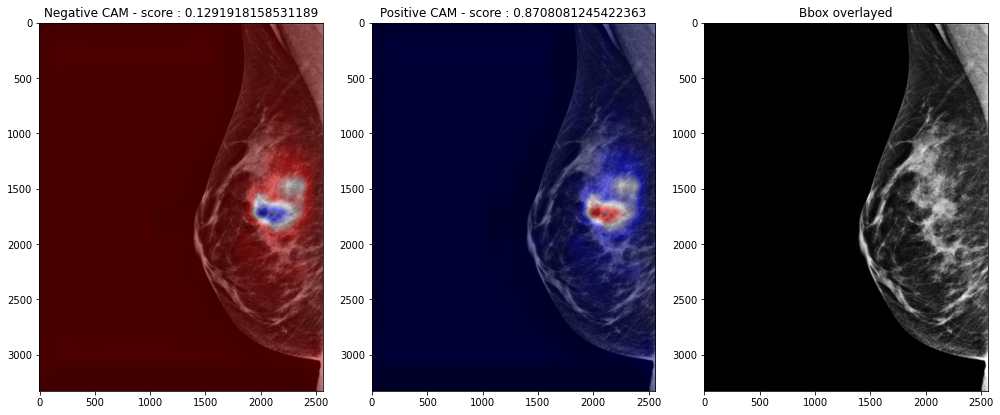

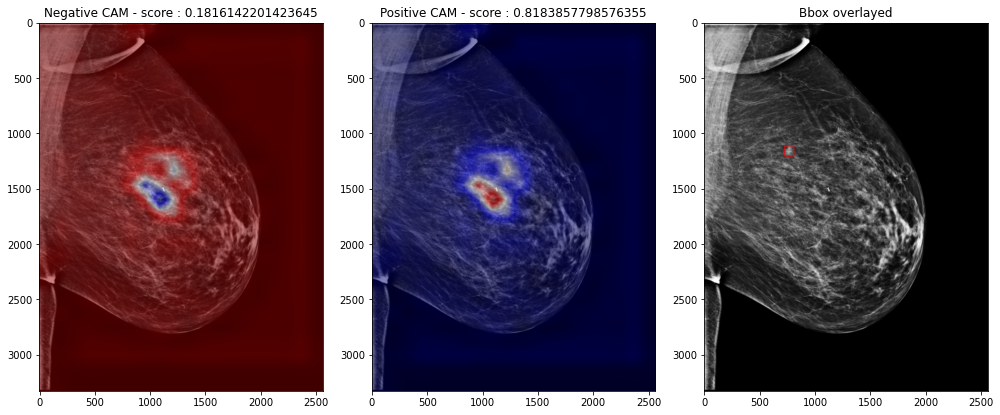

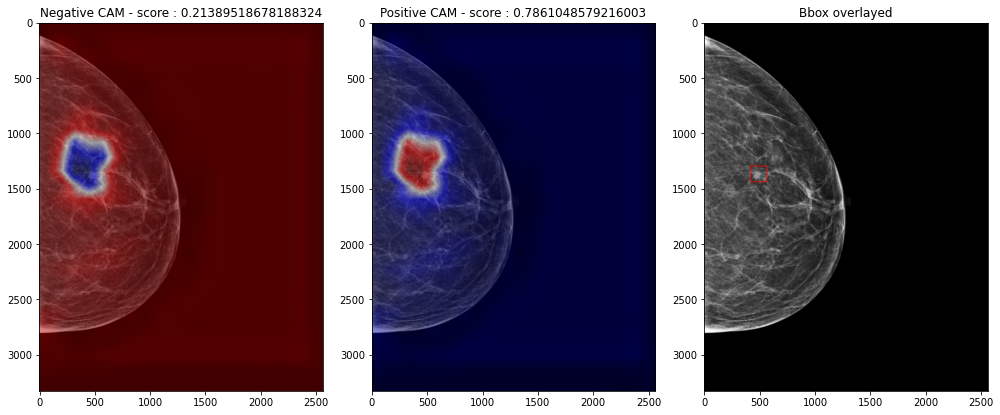

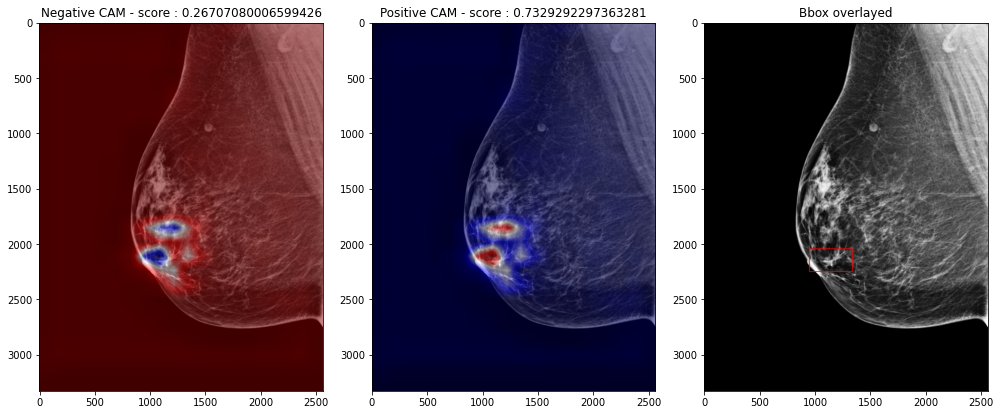

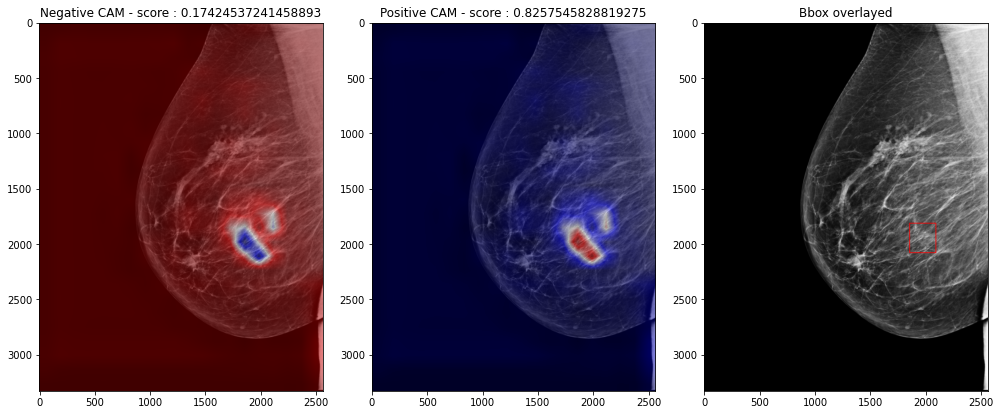

...

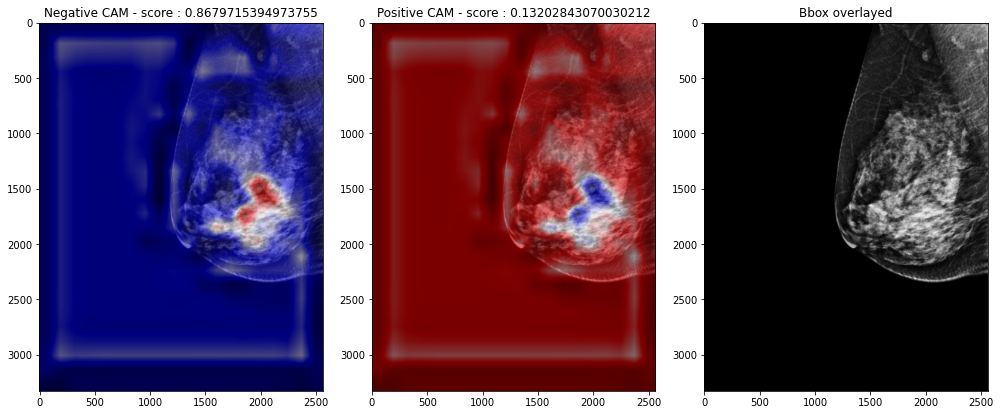

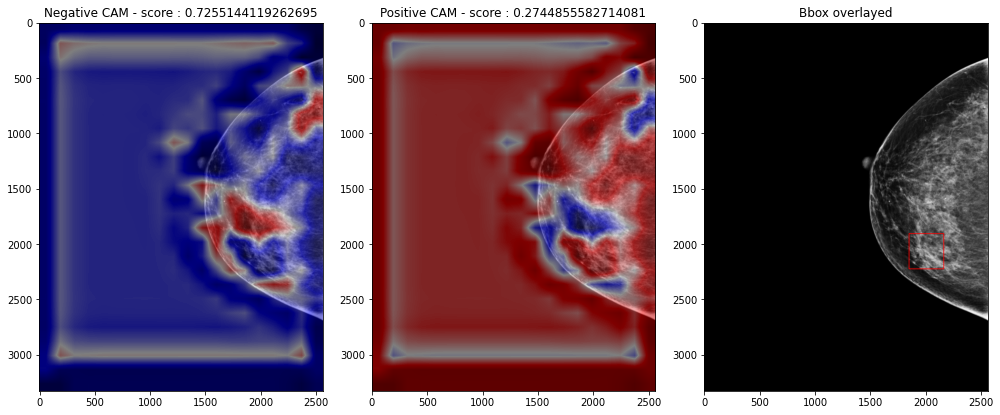

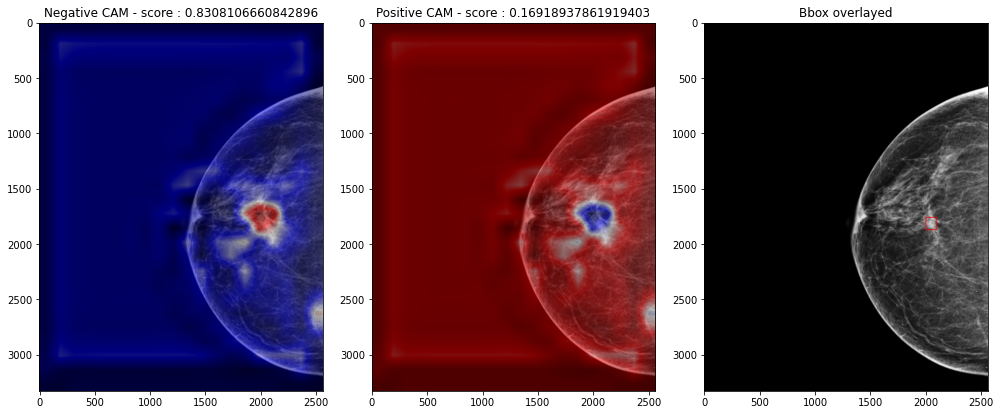

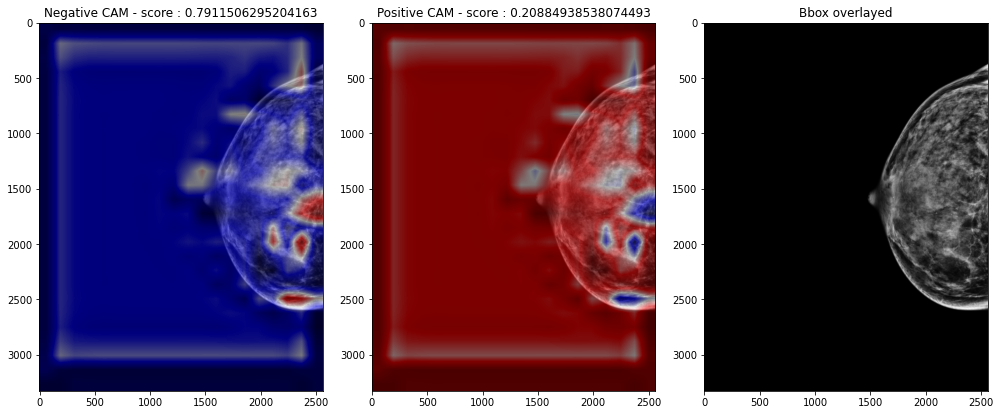

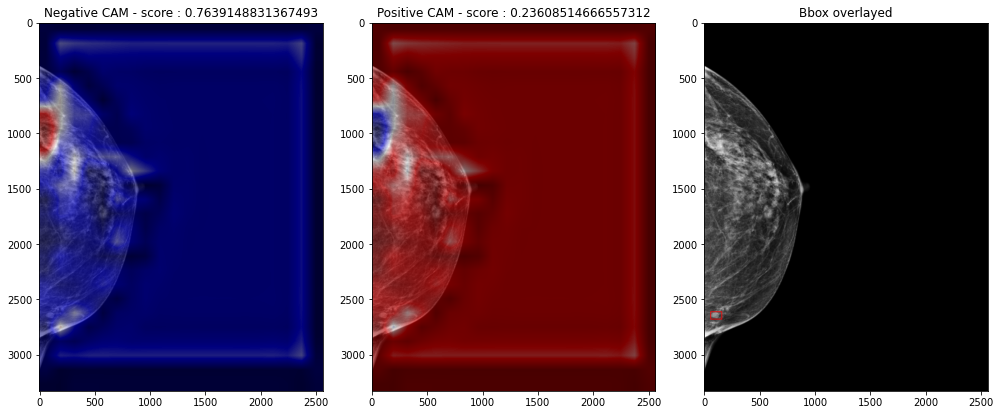

In [46]:
plot_relevancy_cam(transformed_images,bounding_boxes,layer_number=-4)